In [7]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [8]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.07 GB, difference -0.14 GB
scanpy==1.10.2 anndata==0.10.8 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.0.3 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [9]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *
from db_dev.plotting import *

In [10]:
import matplotlib as mpl
mpl.rc("font", family = "Arial")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42


In [11]:
#home_dir = os.path.expanduser("~")
current_directory = os.getcwd()
adata = sc.read_h5ad(current_directory+"/backups/aml_cells_umap_2000counts_9352x37733_250206_15h14.h5ad")

In [40]:
cell_type_color_palette = {
"AML cells 1": "#73472a",
"AML cells 2": "#9e5423",
"AML cells 3": "#ab3803",
"AML cells 4": "#eb8f1e",
"AML cells 5": "#f2621f",
"AML cells 6": "#ad0e0e",
"AML cells 7": "#cc1c00",
"AML cells 8": "#db5a46",
"AML cells 9": "#b85c38",
"AML cells 10": "#e07c57",

"Cycling AML cells 1": "#bf4a2e",
"Cycling AML cells 2": "#d96e3a",
  
"AML Monocytes 1": "#8a0303",
"AML Monocytes 2": "#ff7043",

"Cycling AML Monocytes": "#c4371d",

}



In [15]:
adata_aml = adata.copy()

In [16]:
col_names = ["HSC/Prog_normal_comined", 
             "GMP_normal_comined", 
             "Myeloid_normal_comined", 
             "HSC/Prog-like_tumor_comined", 
             "GMP-like_tumor_comined", 
             "Myeloid-like_tumor_comined", 
             "HSC-like_tumor_celltype", 
             "Progenitor-like_tumor_celltype",
             "GMP-like_tumor_celltype",
             "Promono-like_tumor_celltype",
             "Monocyte-like_tumor_celltype", 
             "cDC-like_tumor_celltype"]


van_galen_markers = pd.read_excel("van_galen_signatures.xlsx", index_col = False, skiprows = 1).iloc[0:51, 1:-1]
van_galen_markers.columns = col_names

In [17]:
#choosing the colormap
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name = "cmap", 
    colors=[
            "white",
            "#c96a6a"
           ])

In [18]:
#Programs from Van Galen et al. 

HSC_Prog_like_combined_VG = list(van_galen_markers["HSC/Prog-like_tumor_comined"][0:30])
GMP_like_combined_VG = list(van_galen_markers["GMP-like_tumor_comined"][0:30])
Myeloid_like_combined_VG = list(van_galen_markers["Myeloid-like_tumor_comined"][0:30])


aml_programs_genes_dict = {
    "HSC/Prog-like": HSC_Prog_like_combined_VG,
    "GMP-like": GMP_like_combined_VG,
    "Myeloid-like": Myeloid_like_combined_VG,
}


In [19]:
# zscale after getting average expresion and df with zscaled averages

import numpy as np
import pandas as pd
from scipy.stats import zscore

for program_name, gene_list in aml_programs_genes_dict.items():
    genes_present = [gene for gene in gene_list if gene in adata_aml.var_names]
    
    if genes_present:
        expression_data = adata_aml[:, genes_present].X
        
        if hasattr(expression_data, "todense"):
            expression_data = expression_data.todense()

        average_expression_per_cell = (
            np.mean(expression_data, axis=1).A1 
            if hasattr(expression_data, "A1") 
            else np.array(np.mean(expression_data, axis=1)).flatten()
        )

        adata_aml.obs[program_name] = average_expression_per_cell

        zscaled_expression = zscore(average_expression_per_cell, nan_policy='omit')

        zscaled_column_name = f"{program_name}_zscaled"
        adata_aml.obs[zscaled_column_name] = zscaled_expression

        print(f"Added average and Z-scaled expression for '{program_name}' to adata_aml.obs.")
    else:
        print(f"No genes from '{program_name}' are present in adata_aml.var_names.")

aml_cells_scores_list = []

for program_name in aml_programs_genes_dict.keys():
    zscaled_column_name = f"{program_name}_zscaled"
    aml_cells_score = adata_aml.obs[["cell_type_sub_prolif_anno", zscaled_column_name]].groupby("cell_type_sub_prolif_anno").mean()
    aml_cells_scores_list.append(aml_cells_score)

aml_cells_scores_df = pd.concat(aml_cells_scores_list, axis=1)

aml_cells_scores_df = aml_cells_scores_df.T

aml_cells_scores_df


Added average and Z-scaled expression for 'HSC/Prog-like' to adata_aml.obs.
Added average and Z-scaled expression for 'GMP-like' to adata_aml.obs.
Added average and Z-scaled expression for 'Myeloid-like' to adata_aml.obs.


cell_type_sub_prolif_anno,AML Monocytes 1,AML Monocytes 2,AML cells 1,AML cells 2,AML cells 3,AML cells 4,AML cells 5,AML cells 6,AML cells 7,AML cells 8,AML cells 9,AML cells 10,Cycling AML Monocytes,Cycling AML cells 1,Cycling AML cells 2
HSC/Prog-like_zscaled,-1.951995,-1.781774,0.858280,-0.206128,0.735989,0.070290,0.109931,0.284324,0.141219,-0.062761,1.235204,-0.148985,-1.607119,-0.014463,-2.040776
GMP-like_zscaled,-0.615753,-0.584966,-0.371507,-0.688408,-0.831307,0.412355,-0.171893,0.001477,0.914724,-0.475189,-0.053829,-0.392768,1.348210,0.579302,2.674839
Myeloid-like_zscaled,2.447745,2.525418,-0.376869,-0.639585,-0.616878,-0.252475,-0.514788,-0.390219,-0.222956,-0.606005,-0.522754,-0.351413,1.694995,-0.258277,0.586952


In [ ]:
# assigning the phenotype based on the highest zscaled value across the three columns
adata_aml.obs["phenotype_per_cell"] = adata_aml.obs[["HSC/Prog-like_zscaled", "GMP-like_zscaled", "Myeloid-like_zscaled"]].idxmax(axis=1)
# replaceing column names with the appropriate phenotype names
adata_aml.obs["phenotype_per_cell"] = adata_aml.obs["phenotype_per_cell"].replace({
    "HSC/Prog-like_zscaled": "HSC/Prog-like",
    "GMP-like_zscaled": "GMP-like",
    "Myeloid-like_zscaled": "Myeloid-like"
})

In [21]:
# updating phenotype_per_cell where "cell_type_sub_prolif_anno" contains "Cycling AML"
adata_aml.obs.loc[adata_aml.obs["cell_type_sub_prolif_anno"].str.contains("Cycling AML", na=False), "phenotype_per_cell"] = "Cycling cells"


In [22]:

# group by both cell type and phenotype to get percentage
grouped_counts = adata_aml.obs.groupby(["cell_type_sub_prolif_anno", "phenotype_per_cell"]).size().unstack(fill_value=0).copy()

phenotype_percentage = grouped_counts.div(grouped_counts.sum(axis=1), axis=0) * 100
phenotype_percentage = phenotype_percentage[["HSC/Prog-like", "GMP-like", "Myeloid-like"]].T
phenotype_percentage.to_excel("csv/final/all_aml_blasts_phenotype_percentage_v1.xlsx")
phenotype_percentage



cell_type_sub_prolif_anno,AML Monocytes 1,AML Monocytes 2,AML cells 1,AML cells 2,AML cells 3,AML cells 4,AML cells 5,AML cells 6,AML cells 7,AML cells 8,AML cells 9,AML cells 10,Cycling AML Monocytes,Cycling AML cells 1,Cycling AML cells 2
phenotype_per_cell,,,,,,,,,,,,,,,
HSC/Prog-like,0.0,0.000000,89.066667,62.711864,93.523600,33.317191,62.745098,64.035088,23.235294,61.881188,87.425150,48.854962,0.0,0.0,0.0
GMP-like,0.0,0.114548,8.533333,19.774011,3.293085,56.198547,29.019608,32.456140,72.647059,22.029703,11.377246,27.480916,0.0,0.0,0.0
Myeloid-like,100.0,99.885452,2.400000,17.514124,3.183315,10.484262,8.235294,3.508772,4.117647,16.089109,1.197605,23.664122,0.0,0.0,0.0


In [24]:
# mapping for new column "program"

programs = ["HSC/Prog-like", "GMP-like", "Myeloid-like", "Cycling cells"]

program_mapping = {
    "AML cells 1": "HSC/Prog-like",
    "AML cells 2": "HSC/Prog-like",
    "AML cells 5": "HSC/Prog-like",
    "AML cells 8": "HSC/Prog-like",
    "AML cells 9": "HSC/Prog-like",
    "AML cells 6": "HSC/Prog-like",
    "AML cells 10": "HSC/Prog-like",
    "AML cells 4": "GMP-like",
    "AML cells 7": "GMP-like",
    "AML cells 3": "HSC/Prog-like",
    "AML Monocytes 2": "Myeloid-like",
    "AML Monocytes 1": "Myeloid-like",
    "Cycling AML cells 1": "Cycling cells", 
    "Cycling AML cells 2": "Cycling cells", 
    "Cycling AML Monocytes": "Cycling cells"
    
}

# assigning new column based on mapping

adata_aml.obs["phenotype_per_cell_type"] = adata_aml.obs["cell_type_sub_prolif_anno"].map(program_mapping)
adata_aml.obs["phenotype_per_cell_type"] = pd.Categorical(adata_aml.obs["phenotype_per_cell_type"], categories=["HSC/Prog-like", "GMP-like", "Myeloid-like", "Cycling cells"], ordered=True)
adata_aml.obs["phenotype_per_cell"] = pd.Categorical(adata_aml.obs["phenotype_per_cell"], categories=["HSC/Prog-like", "GMP-like", "Myeloid-like", "Cycling cells"], ordered=True)



In [25]:
# mapping for new column CD200-high

programs = ["CD200-high HSC/Prog-like", "HSC/Prog-like", "GMP-like", "Myeloid-like", "Cycling cells"]

program_mapping = {
    "AML cells 1": "HSC/Prog-like",
    "AML cells 2": "HSC/Prog-like",
    "AML cells 5": "HSC/Prog-like",
    "AML cells 8": "HSC/Prog-like",
    "AML cells 9": "HSC/Prog-like",
    "AML cells 6": "HSC/Prog-like",
    "AML cells 10": "HSC/Prog-like",
    "AML cells 4": "GMP-like",
    "AML cells 7": "GMP-like",
    "AML cells 3": "CD200-high HSC/Prog-like",
    "AML Monocytes 2": "Myeloid-like",
    "AML Monocytes 1": "Myeloid-like",
    "Cycling AML cells 1": "Cycling cells", 
    "Cycling AML cells 2": "Cycling cells", 
    "Cycling AML Monocytes": "Cycling cells"
    
}

# assigning new column based on mapping

adata_aml.obs["phenotype_per_cell_type_CD200"] = adata_aml.obs["cell_type_sub_prolif_anno"].map(program_mapping)
adata_aml.obs["phenotype_per_cell_type_CD200"] = pd.Categorical(adata_aml.obs["phenotype_per_cell_type_CD200"], categories=["CD200-high HSC/Prog-like", "HSC/Prog-like", "GMP-like", "Myeloid-like", "Cycling cells"], ordered=True)



In [26]:
phenotype_color_palette = {
    "CD200-high HSC/Prog-like": "#9b59b6",            
    "HSC/Prog-like": "#f7c77d",  
    "GMP-like": "#61b89e",            
    "Myeloid-like": "#d95f5f",       
    "Cycling cells": "lightgray"

}

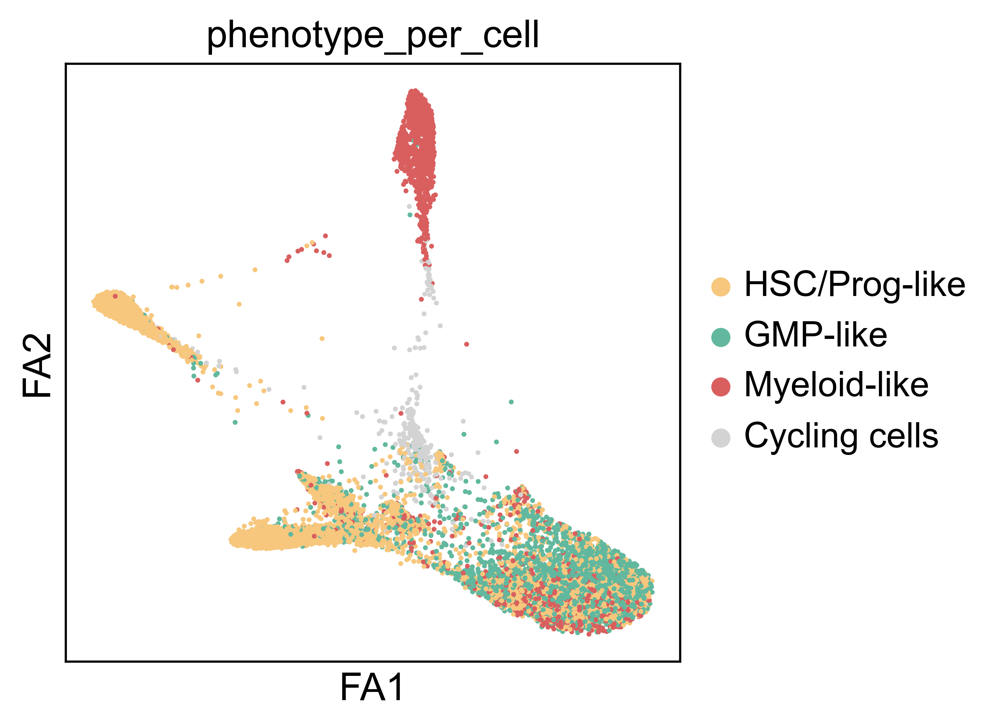

In [29]:
# need to run for each column each time to assign palette (phenotype_per_cell, phenotype_per_cell_type, phenotype_per_cell_type_CD200)
sc.pl.draw_graph(adata_aml, color="phenotype_per_cell", palette = phenotype_color_palette)

In [46]:
# To randomize cells
sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 1200, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)


np.random.seed(69)
random_indices = np.random.permutation(list(range(adata_aml.shape[0])))


sc.pl.draw_graph(adata_aml[random_indices, :], color=[
                              "HSC/Prog-like_zscaled", "GMP-like_zscaled", "Myeloid-like_zscaled", "phenotype_per_cell", "phenotype_per_cell_type", "cell_type_sub_prolif_anno"], 
                 size = 10, alpha = 1, legend_fontsize=8, ncols=3, wspace = 0.3, vmax = 2, vmin = -1, show = False) #legend_loc='on data', 


plt.savefig("figures/final/all_aml_blasts_phenotype_fa_2000counts_v3.pdf", transparent=True, bbox_inches="tight")


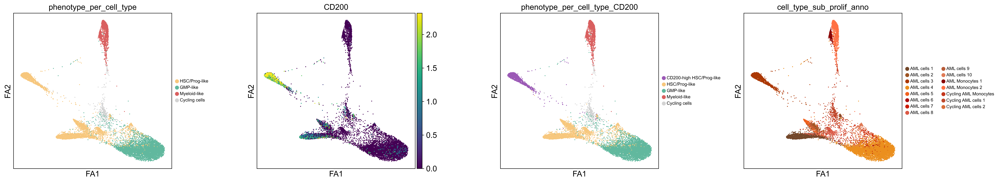

In [45]:
sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 1200, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)



# To randomize cells
np.random.seed(69)
random_indices = np.random.permutation(list(range(adata_aml.shape[0])))


sc.pl.draw_graph(adata_aml[random_indices, :], color=[#"HSC/Prog-like", "GMP-like", "Myeloid-like",
                              "phenotype_per_cell_type", "CD200", "phenotype_per_cell_type_CD200", "cell_type_sub_prolif_anno"], 
                 size = 10, alpha = 1, legend_fontsize=8, ncols=4, wspace = 0.4, vmax = "p99", show = False) #legend_loc='on data', 


plt.savefig("figures/final/all_aml_blasts_phenotype_CD200_fa_2000counts_v3.pdf", transparent=True, bbox_inches="tight")


In [30]:
clusters = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15"]

program_mapping = {
    "AML cells 1": "1",
    "AML cells 2": "2",
    "AML cells 3": "3",
    "AML cells 4": "4",
    "AML cells 5": "5",
    "AML cells 6": "6",
    "AML cells 7": "7",
    "AML cells 8": "8",
    "AML cells 9": "9",
    "AML cells 10": "10",
    "AML Monocytes 1": "11",
    "AML Monocytes 2": "12",
    "Cycling AML Monocytes": "13",
    "Cycling AML cells 1": "14",
    "Cycling AML cells 2": "15",
}

adata_aml.obs["cluster"] = adata_aml.obs["cell_type_sub_prolif_anno"].map(program_mapping)
adata_aml.obs["cluster"] = pd.Categorical(adata_aml.obs["cluster"], categories=clusters, ordered=True)


cluster_color_palette = {

"1": "#73472a", #AML cells 1
"2": "#9e5423", #AML cells 2
"3": "#ab3803", #AML cells 3
"4": "#eb8f1e", #AML cells 4
"5": "#f2621f", #AML cells 5
"6": "#ad0e0e", #AML cells 6
"7": "#cc1c00", #AML cells 7
"8": "#db5a46", #AML cells 8
"9": "#b85c38", #AML cells 9
"10": "#e07c57", #AML cells 10

"11": "#8a0303", #AML Monocytes 1
"12": "#ff7043", #AML Monocytes 2    

"13": "#c4371d", #Cycling AML Monocytes

"14": "#bf4a2e", #Cycling AML cells 1
"15": "#d96e3a", # Cycling AML cells 2
  
}


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


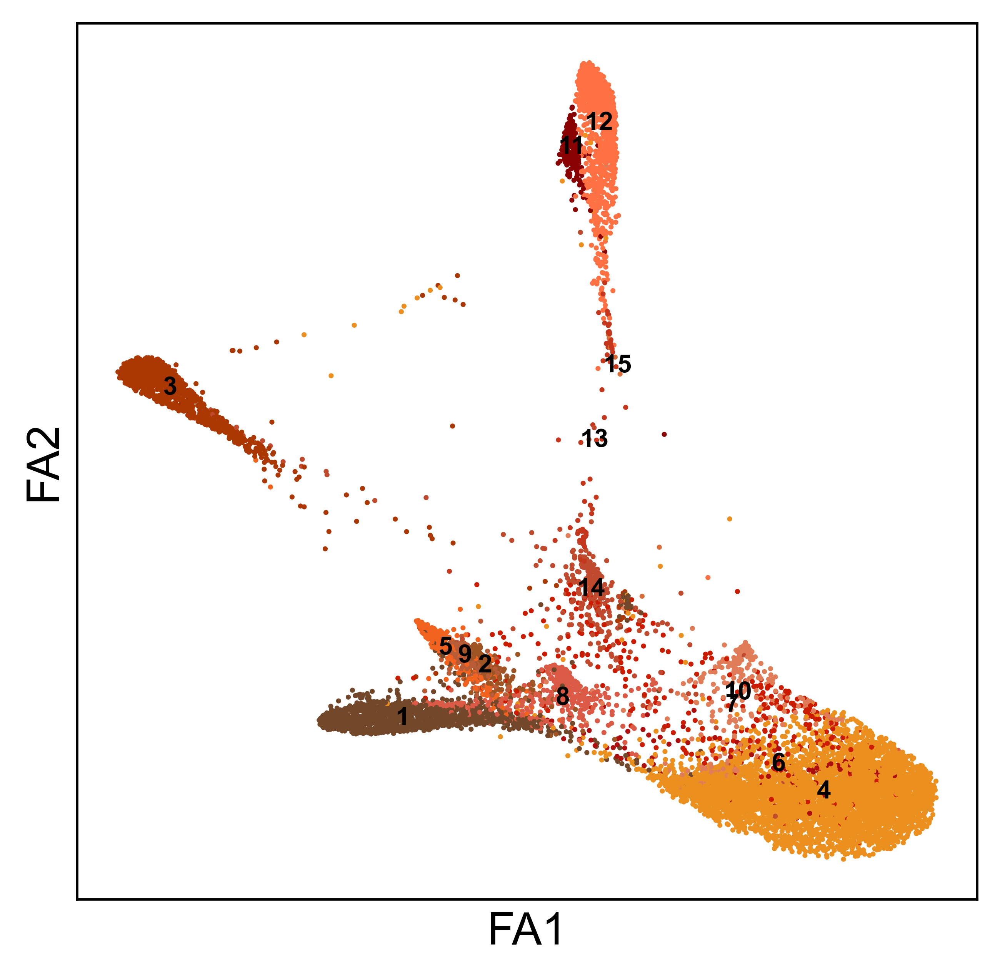

In [32]:
sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 1200, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)


# To randomize cells
np.random.seed(69)
random_indices = np.random.permutation(list(range(adata_aml.shape[0])))


sc.pl.draw_graph(adata_aml[random_indices, :], color=["cluster"], 
                 size = 10, alpha = 1, legend_fontsize=8, vmax = "p99", show = False, legend_loc='on data', title = "", palette=cluster_color_palette)  #, legend_fontoutline = 1

plt.savefig("figures/final/all_aml_blasts_phenotype_numbers_fa_2000counts_v7.pdf", transparent=True, bbox_inches="tight")


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


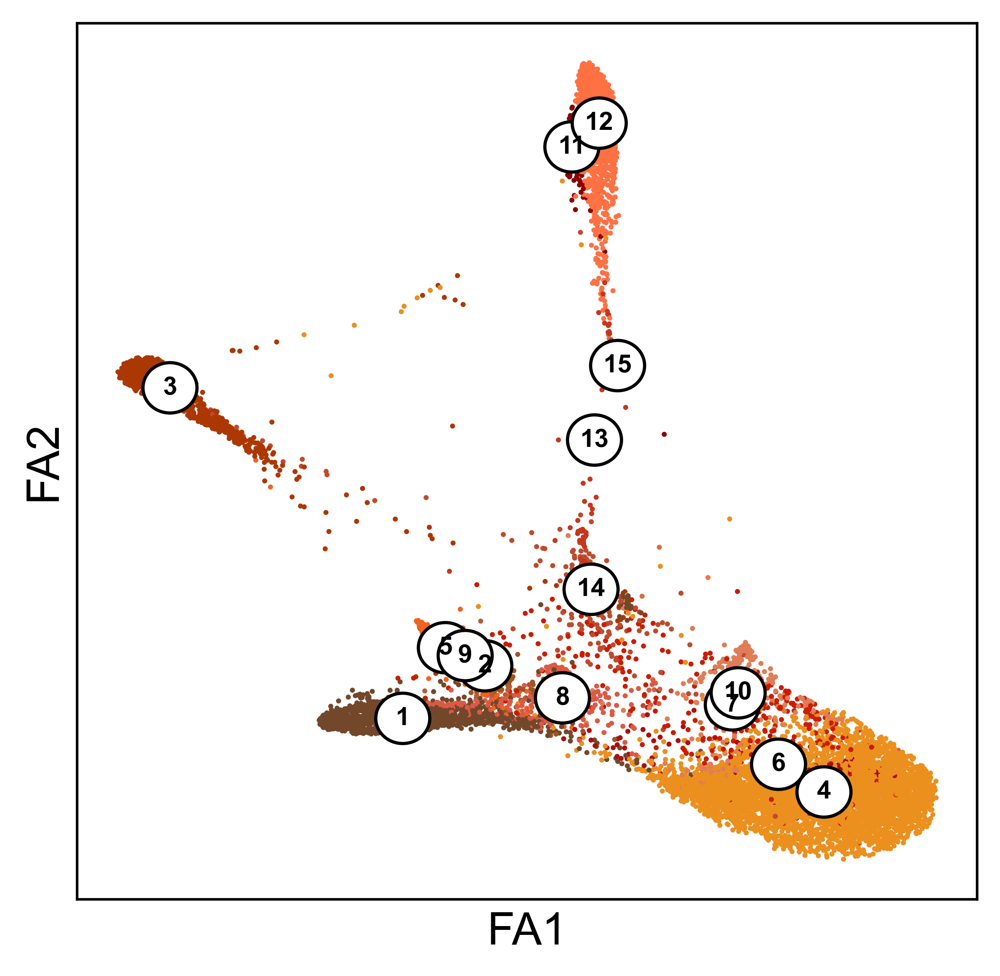

In [33]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as patches

sc.settings.set_figure_params(dpi=300, 
                              dpi_save=1200, 
                              transparent=True, 
                              figsize=(5, 5), 
                              vector_friendly=False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata_aml.shape[0])))

sc.pl.draw_graph(adata_aml[random_indices, :], 
                 color=["cluster"], 
                 size=10, 
                 alpha=1, 
                 legend_fontsize=8, 
                 vmax="p99", 
                 show=False, 
                 legend_loc='on data', 
                 title="", 
                 palette=cluster_color_palette)


ax = plt.gca()
renderer = plt.gcf().canvas.get_renderer()


xlim = ax.get_xlim()
fixed_radius = (0.02 * (xlim[1] - xlim[0])) * 1.5


for txt in ax.texts:
    txt.set_bbox(dict(facecolor='none', edgecolor='none'))
    
    bbox = txt.get_window_extent(renderer=renderer)
    inv = ax.transData.inverted()
    bbox_data = bbox.transformed(inv)
    center = (bbox_data.x0 + bbox_data.width / 2, 
              bbox_data.y0 + bbox_data.height / 2)
    
    circle = patches.Circle(center, 
                            radius=fixed_radius, 
                            facecolor='white', 
                            edgecolor='black', 
                            lw=1, 
                            zorder=txt.get_zorder() - 1)
    ax.add_patch(circle)


plt.savefig("figures/final/all_aml_blasts_phenotype_numbers_fa_2000counts_v9.pdf", transparent=True, bbox_inches="tight")
plt.show()


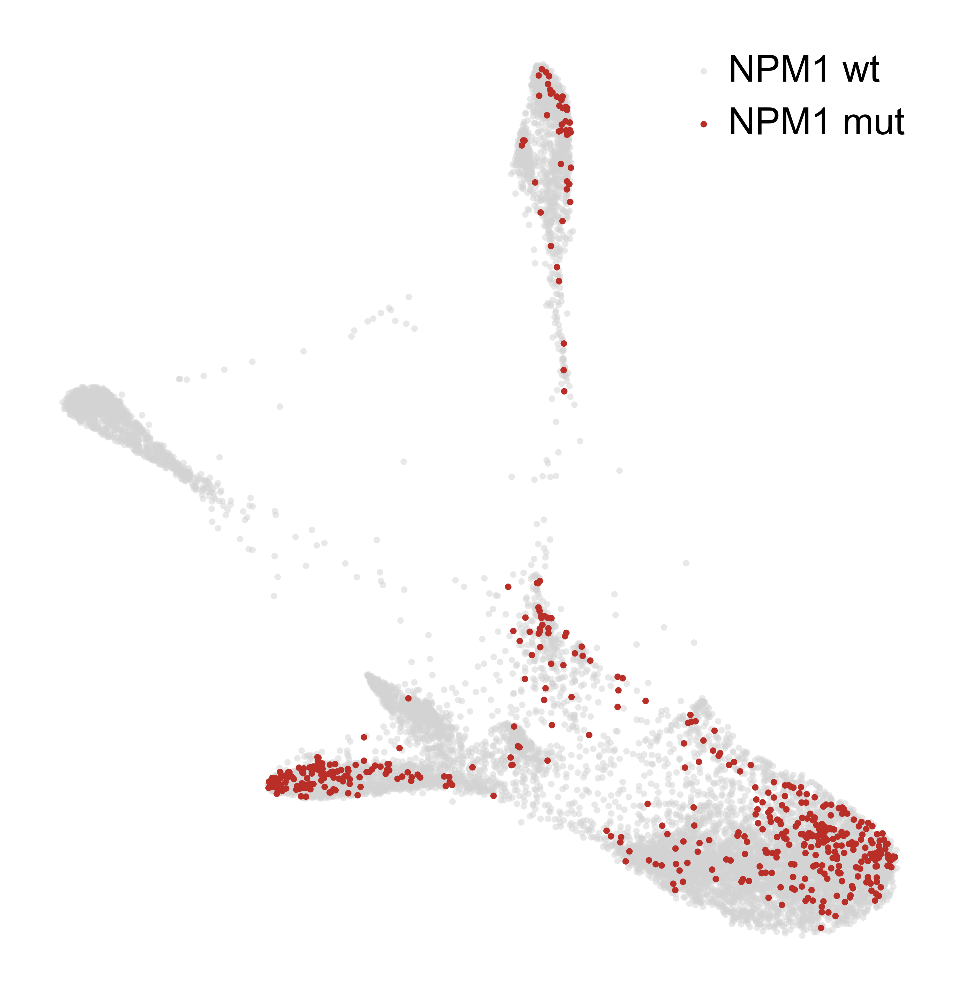

In [173]:
# NPM Mutation on FA

renamer_library = {
    "22_CASP_DB_68_S1_Solo.out":"BB2.1",
    "22_CASP_DB_69_S2_Solo.out":"BB2.2",
    "22_CASP_DB_70_S3_Solo.out":"BB2.3",
    "22_CASP_DB_71_S4_Solo.out":"BB2.4",
    "22_CASP_DB_72_S5_Solo.out":"BB2.5",
    "22_CASP_DB_73_S6_Solo.out":"BB2.6",
    "22_CASP_DB_74_S7_Solo.out":"BB2.7",
    "22_CASP_DB_75_S8_Solo.out":"BB2.8",
    "22_CASP_DB_76_S9_Solo.out":"BB2.9",
    "22_CASP_DB_77_S10_Solo.out":"BB2.11",
    "22_CASP_DB_78_S1_Solo.out":"BB3.1",
    "22_CASP_DB_79_S2_Solo.out":"BB3.2",
    "22_CASP_DB_80_S3_Solo.out":"BB3.3",
    "22_CASP_DB_81_S4_Solo.out":"BB3.4",
    "22_CASP_DB_82_S5_Solo.out":"BB3.5",
    "22_CASP_DB_83_S6_Solo.out":"BB3.6",
    "22_CASP_DB_84_S7_Solo.out":"BB3.7",
    "22_CASP_DB_85_S8_Solo.out":"BB3.8",
    "22_CASP_DB_86_S9_Solo.out":"BB3.9",
    "22_CASP_DB_87_S10_Solo.out":"BB3.10"
}

all_npm1s = []

PATH_TO_NPM1_READS = "grep_bam_for_npm1/mut_reads/"
PATIENT_COLUMN = "code_renamed"

for file in os.listdir(PATH_TO_NPM1_READS):
    path = os.path.join(PATH_TO_NPM1_READS, file)
    npm1_barcodes = pd.read_csv(path,names=["dude"])
    lib = file.split("_Aligned")[0]
    lib = f"{lib}_Solo.out"
    npm1_barcodes["barcode_library"] = npm1_barcodes["dude"] + f"_{renamer_library[lib]}"
    all_npm1s += list(npm1_barcodes["barcode_library"])

adata_aml.obs["barcode_library"] = adata_aml.obs["barcode"].astype(str) + "_" + adata_aml.obs["library"].astype(str)
adata_aml.obs["npm1_barcode"] = adata_aml.obs["barcode_library"].isin(all_npm1s)



import matplotlib.pyplot as plt

umap_coords = adata_aml.obsm["X_draw_graph_fa"]
condition = adata_aml.obs["npm1_barcode"] == True

fig, ax = plt.subplots(figsize=(5, 5))

ax.scatter(
    umap_coords[~condition, 0], 
    umap_coords[~condition, 1], 
    s=5, 
    color="lightgray",
    edgecolors="none",
    alpha=0.5, 
    label="NPM1 wt"
)

ax.scatter(
    umap_coords[condition, 0], 
    umap_coords[condition, 1], 
    s=5, 
    color="#b92f28",
    edgecolors="none",
    alpha=1, 
    label="NPM1 mut"
)

ax.axis("off")

ax.set_aspect("equal")

ax.legend(frameon=False)


plt.tight_layout()
plt.savefig("figures/final/npm1_mutation_all_aml_blasts_fa_2000counts_v1.pdf", transparent=True, bbox_inches="tight")


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


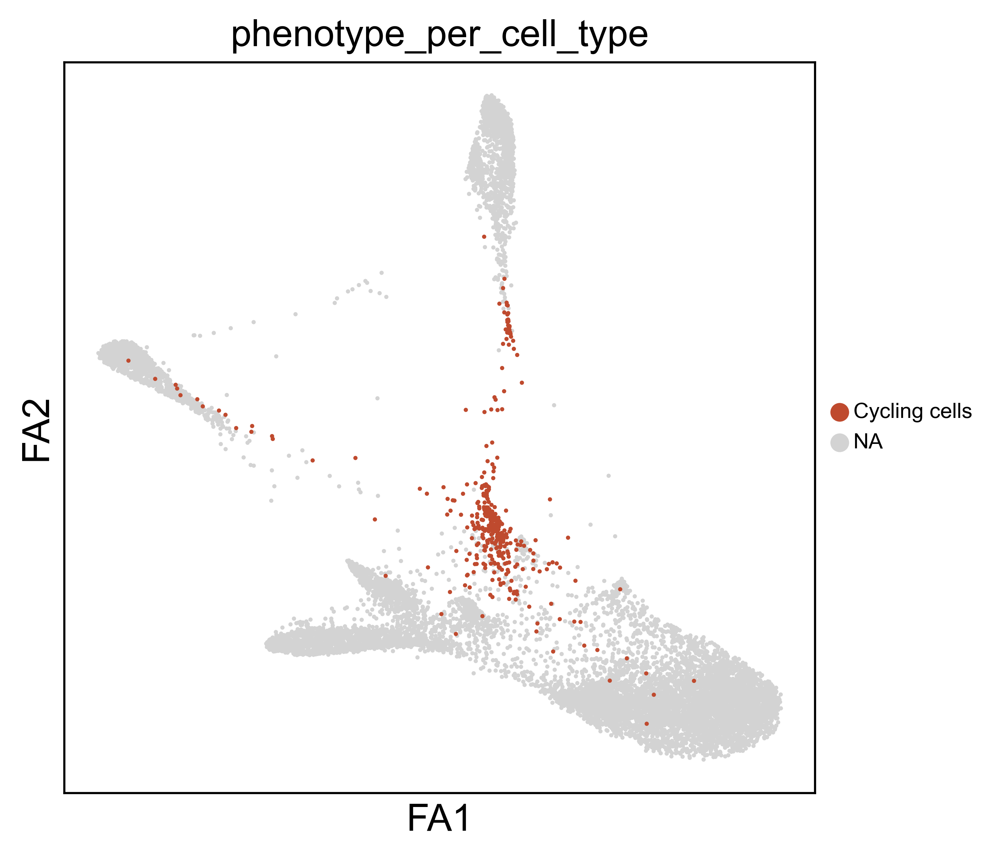

In [32]:
sc.settings.set_figure_params(dpi=300, 
                              dpi_save=1200, 
                              transparent=True, 
                              figsize=(5, 5), 
                              vector_friendly=False)




phenotype_color_palette_new = {
    "CD200-high HSC/Prog-like": "#9b59b6",            
    "HSC/Prog-like": "#f7c77d",  
    "GMP-like": "#61b89e",            
    "Myeloid-like": "#d95f5f",       
    "Cycling cells": "#bf4a2e"

}


sc.pl.draw_graph(adata_aml[random_indices, :], color=["phenotype_per_cell_type"], groups = ["Cycling cells"],
                 size = 10, alpha = 1, legend_fontsize=8, ncols=3, wspace = 0.3, vmax = 2, vmin = -1, palette=phenotype_color_palette_new, show = False) #legend_loc='on data', 

plt.savefig("figures/final/all_aml_blasts_fa_2000counts_cycling_cells_1_v4.pdf", bbox_inches="tight", transparent = True)




/var/folders/sv/fwsrf8xs57jd9rtwwfxmyxg80000gn/T/ipykernel_1465/1720797825.py:88: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


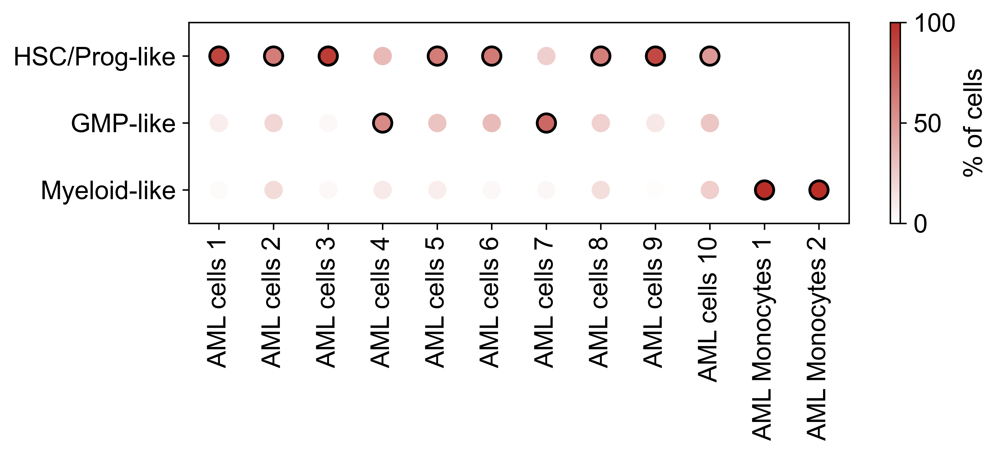

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

aml_cells_scores_df_norm = phenotype_percentage[['AML cells 1', 'AML cells 2', 'AML cells 3', 'AML cells 4', 'AML cells 5', 'AML cells 6', 'AML cells 7', 'AML cells 8', 'AML cells 9', 'AML cells 10', 'AML Monocytes 1', 'AML Monocytes 2']].T.copy()

program_mapping = {
    "AML cells 1": "HSC/Prog-like",
    "AML cells 2": "HSC/Prog-like",
    "AML cells 5": "HSC/Prog-like",
    "AML cells 8": "HSC/Prog-like",
    "AML cells 9": "HSC/Prog-like",
    "AML cells 6": "HSC/Prog-like",
    "AML cells 10": "HSC/Prog-like",
    "AML cells 4": "GMP-like",
    "AML cells 7": "GMP-like",
    "AML cells 3": "HSC/Prog-like",
    "AML Monocytes 2": "Myeloid-like",
    "AML Monocytes 1": "Myeloid-like"
    
}

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(
    name="cmap", 
    colors=[
        "white",
        "#b92f28"
    ]
)

df = aml_cells_scores_df_norm.T.copy()

fig, ax = plt.subplots(figsize=(8, 2))

for i, row in enumerate(df.itertuples(index=False)):
    for j, value in enumerate(row):
        column_name = df.columns[j]
        subtype = df.index[i]
        ax.scatter(
            j, 
            i, 
            color=cmap(value / 100), 
            s=100, 
            edgecolor="black" if program_mapping.get(column_name) == subtype else None, 
            linewidths=1.5 if program_mapping.get(column_name) == subtype else 0
        )

ax.set_xticks(range(len(df.columns)))
ax.set_xticklabels(df.columns, rotation=90, ha='center')
ax.set_yticks(range(len(df.index)))
ax.set_yticklabels(df.index)

ax.invert_yaxis()
padding = 0.5
ax.set_ylim(len(df.index) - 1 + padding, -padding)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=100))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation="vertical")
cbar.set_label("% of cells")

ax.grid(False)
ax.set_xlabel("")
ax.set_ylabel("")

plt.tight_layout()

plt.savefig("figures/final/aml_blasts_per_phenotype_2000counts_v1.pdf", transparent=True, bbox_inches="tight")
